### Importing Packages

In [0]:
#importing packages
import nltk  #The Natural Language Toolkit (NLTK) is an open source Python library for Natural Language Processing.  
import re  #This module provides regular expression matching operations similar to those found in Perl
from nltk.tokenize import sent_tokenize 
from nltk.tokenize import word_tokenize 
import string, sys #This module provides access to some objects used or maintained by the interpreter and to functions that interact strongly with the interpreter.
import os #OS routines for NT or Posix depending on what system we're on.
import pandas as pd # a powerful data analysis and manipulation library for Python
import matplotlib.pyplot as plt # for visualization
pd.set_option("display.max_colwidth", 200)
import numpy as np  # Fast mathematical operations over arrays
import json 
import gzip #Functions that read and write gzipped files.
import spacy #can be used to build information extraction or natural language understanding systems, or to pre-process text for deep learning.
import matplotlib.pyplot as plt #for visualization

In [58]:
!pip install PyDrive #for loading data using drive
!pip install gensim #for topic modeling
!pip install pyldavis  #for interactive topic model visualization
!python -m spacy download en #he lookups package is needed to create blank models with lemmatization data, and to lemmatize in languages.

✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')
✔ Linking successful
/usr/local/lib/python3.6/dist-packages/en_core_web_sm -->
/usr/local/lib/python3.6/dist-packages/spacy/data/en
You can now load the model via spacy.load('en')


In [0]:
import gensim
from gensim import corpora

import pyLDAvis
import pyLDAvis.gensim
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [61]:
#loading the data
from google.colab import files
uploaded = files.upload() 

Saving flipkart_review.csv to flipkart_review (1).csv


In [0]:
import io  
data = pd.read_csv(io.BytesIO (uploaded['flipkart_review.csv']),encoding='utf-8-sig', usecols= ['date', 'review']) 

In [0]:
data['date'] = pd.to_datetime(data['date'], errors='coerce')

In [64]:
data.head()

,date,review
0,2020-02-24,"I really love the camera, though I would have loved a telephoto lens. The super steady OIS works like a charm.I have been using Mi A1 with Android One platform before, I find it a bit hard to find..."
1,2020-02-24,"UNLEASHING the Beast, among Snapdragon 855 !!!Highest AnTuTu Score of 472721 for 855 Chipset.4th among the top rankings. Second to 855+ Chipset.I received an 'All White' product.Made in Vietnam.Mo..."
2,2020-02-24,"I purchased this product during its presale. I was purchasing a new device for personal use after 2.5 years, the smartphone world had changed a lot since then. But my close friend purchased Oneplu..."
3,2020-02-24,One of the best phone ever at this price .. verry smooth to use well battery backup and fantastic display and design...just loved it
4,2020-02-24,IT'S INSANE.. Great Mobile. With Great Features and Great Processor. With super Display and Insane Camera. When i hold it in my hand. It feels like iam holding a Prism in my Hand. #SamsungRock...


In [65]:
data.shape  #checking the shape of the data

(140720, 2)

In [66]:
data["review"]  # checking review column

0         I really love the camera, though I would have loved a telephoto lens. The super steady OIS works like a charm.I have been using Mi A1 with Android One platform before, I find it a bit hard to find...
1         UNLEASHING the Beast, among Snapdragon 855 !!!Highest AnTuTu Score of 472721 for 855 Chipset.4th among the top rankings. Second to 855+ Chipset.I received an 'All White' product.Made in Vietnam.Mo...
2         I purchased this product during its presale. I was purchasing a new device for personal use after 2.5 years, the smartphone world had changed a lot since then. But my close friend purchased Oneplu...
3                                                                            One of the best phone ever at this price .. verry smooth to use well battery backup and fantastic display and design...just loved it
4         IT'S  INSANE.. Great Mobile. With Great Features and Great Processor. With super Display and Insane Camera. When i hold it in my  hand. It feels like 

# Basic feature extraction using text data

### Number of words

In [67]:
data['word_count'] = data['review'].apply(lambda x: len(str(x).split(" ")))
data[['review','word_count']].head(10)                        #counting number of words in every review

,review,word_count
0,"I really love the camera, though I would have loved a telephoto lens. The super steady OIS works like a charm.I have been using Mi A1 with Android One platform before, I find it a bit hard to find...",86
1,"UNLEASHING the Beast, among Snapdragon 855 !!!Highest AnTuTu Score of 472721 for 855 Chipset.4th among the top rankings. Second to 855+ Chipset.I received an 'All White' product.Made in Vietnam.Mo...",74
2,"I purchased this product during its presale. I was purchasing a new device for personal use after 2.5 years, the smartphone world had changed a lot since then. But my close friend purchased Oneplu...",87
3,One of the best phone ever at this price .. verry smooth to use well battery backup and fantastic display and design...just loved it,24
4,IT'S INSANE.. Great Mobile. With Great Features and Great Processor. With super Display and Insane Camera. When i hold it in my hand. It feels like iam holding a Prism in my Hand. #SamsungRock...,42
5,Simply superb phone in this price range desreve 5 Star rating Camera: 5/5Screen: 5/5Battery: 4/5Charger: 5/5Built: 5/5 Glasstic back cover though is a bit disappointment.Face unlock: 5/5Colour: 5/...,73
6,Best CameraBest Performance Best Battery BackupVideo Quality Awsome,8
7,I like this mobile Samsung Galaxy S10 Lite Prism White Colour It's Screen is awesomeAnd it's battery also is niceThank You Filpkart,22
8,Do not opt to sell your old phone with flipkart...they cheat you while pickup if your phone qualify all criteria than also they will not pick up or reduce the value of phone...please do not exchan...,57
9,Awesome phoneSamsung unveils a awesome S series in unbelievable price!!!!!.....Pros: Pro grade camera Awesome Super Amoled display with punch hole cameraSuper fast chargingSnapdragon 855GB ram for...,38


### Number of characters

In [68]:
data['char_count'] = data['review'].str.len() ## this also includes spaces
data[['review','char_count']].head(10)  

,review,char_count
0,"I really love the camera, though I would have loved a telephoto lens. The super steady OIS works like a charm.I have been using Mi A1 with Android One platform before, I find it a bit hard to find...",492
1,"UNLEASHING the Beast, among Snapdragon 855 !!!Highest AnTuTu Score of 472721 for 855 Chipset.4th among the top rankings. Second to 855+ Chipset.I received an 'All White' product.Made in Vietnam.Mo...",485
2,"I purchased this product during its presale. I was purchasing a new device for personal use after 2.5 years, the smartphone world had changed a lot since then. But my close friend purchased Oneplu...",500
3,One of the best phone ever at this price .. verry smooth to use well battery backup and fantastic display and design...just loved it,132
4,IT'S INSANE.. Great Mobile. With Great Features and Great Processor. With super Display and Insane Camera. When i hold it in my hand. It feels like iam holding a Prism in my Hand. #SamsungRock...,214
5,Simply superb phone in this price range desreve 5 Star rating Camera: 5/5Screen: 5/5Battery: 4/5Charger: 5/5Built: 5/5 Glasstic back cover though is a bit disappointment.Face unlock: 5/5Colour: 5/...,487
6,Best CameraBest Performance Best Battery BackupVideo Quality Awsome,67
7,I like this mobile Samsung Galaxy S10 Lite Prism White Colour It's Screen is awesomeAnd it's battery also is niceThank You Filpkart,131
8,Do not opt to sell your old phone with flipkart...they cheat you while pickup if your phone qualify all criteria than also they will not pick up or reduce the value of phone...please do not exchan...,320
9,Awesome phoneSamsung unveils a awesome S series in unbelievable price!!!!!.....Pros: Pro grade camera Awesome Super Amoled display with punch hole cameraSuper fast chargingSnapdragon 855GB ram for...,306


### Average word length

In [69]:
data.loc[23159]['review']  # review is blank 

'       '

In [0]:
data.drop(23159 , inplace = True)   #droping the blank review

In [0]:
def avg_word(review):
    words = review.split()
    return (sum(len(word) for word in words)/len(words))  #finding average word length

In [73]:
def avg_word(sentence):
    words = sentence.split()
    return (sum(len(word) for word in words)/len(words))

data['avg_word'] = data['review'].apply(lambda x: avg_word(x)) # adding one new field as avg_word
data[['review','avg_word']].head() 

,review,avg_word
0,"I really love the camera, though I would have loved a telephoto lens. The super steady OIS works like a charm.I have been using Mi A1 with Android One platform before, I find it a bit hard to find...",4.732558
1,"UNLEASHING the Beast, among Snapdragon 855 !!!Highest AnTuTu Score of 472721 for 855 Chipset.4th among the top rankings. Second to 855+ Chipset.I received an 'All White' product.Made in Vietnam.Mo...",5.567568
2,"I purchased this product during its presale. I was purchasing a new device for personal use after 2.5 years, the smartphone world had changed a lot since then. But my close friend purchased Oneplu...",4.758621
3,One of the best phone ever at this price .. verry smooth to use well battery backup and fantastic display and design...just loved it,4.541667
4,IT'S INSANE.. Great Mobile. With Great Features and Great Processor. With super Display and Insane Camera. When i hold it in my hand. It feels like iam holding a Prism in my Hand. #SamsungRock...,4.805556


## Plotting the frequency of words in reviews

In [74]:
import nltk
from nltk import FreqDist
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [0]:
def freq_words(x, terms = 30):
  all_words = ' '.join([text for text in x])
  all_words = all_words.split()
  
  fdist = FreqDist(all_words)
  words_df = pd.DataFrame({'word':list(fdist.keys()), 'count':list(fdist.values())})
  
  # selecting top 20 most frequent words
  d = words_df.nlargest(columns="count", n = terms) 
  plt.figure(figsize=(20,5))
  ax = sns.barplot(data=d, x= "word", y = "count")
  ax.set(ylabel = 'Count')
  plt.show()

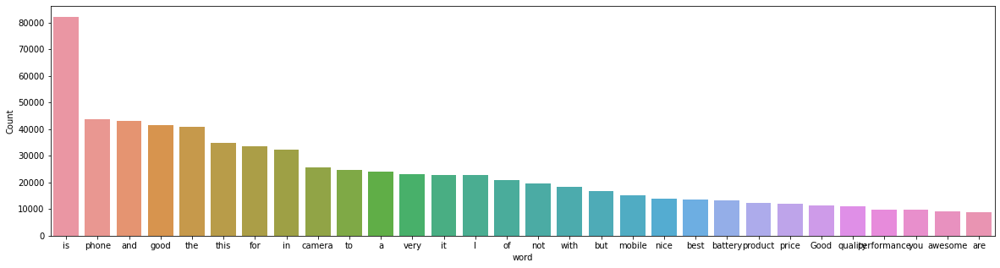

In [76]:
freq_words(data['review'])

### Here we can see that unrelevant words are in this graph like - is,and,the,this. We will remove by lammatization and stop word removal 

### Number of stopwords

In [77]:
from nltk.corpus import stopwords
stop = stopwords.words('english')

data['stopwords'] = data['review'].apply(lambda x: len([x for x in x.split() if x in stop]))
data[['review','stopwords']].head()  #counting stopwords in every review

,review,stopwords
0,"I really love the camera, though I would have loved a telephoto lens. The super steady OIS works like a charm.I have been using Mi A1 with Android One platform before, I find it a bit hard to find...",28
1,"UNLEASHING the Beast, among Snapdragon 855 !!!Highest AnTuTu Score of 472721 for 855 Chipset.4th among the top rankings. Second to 855+ Chipset.I received an 'All White' product.Made in Vietnam.Mo...",10
2,"I purchased this product during its presale. I was purchasing a new device for personal use after 2.5 years, the smartphone world had changed a lot since then. But my close friend purchased Oneplu...",31
3,One of the best phone ever at this price .. verry smooth to use well battery backup and fantastic display and design...just loved it,8
4,IT'S INSANE.. Great Mobile. With Great Features and Great Processor. With super Display and Insane Camera. When i hold it in my hand. It feels like iam holding a Prism in my Hand. #SamsungRock...,9


### Number of special characters

In [78]:
data['hastags'] = data['review'].apply(lambda x: len([x for x in x.split() if x.startswith('#')]))
data[['review','hastags']].head()    # counting special characters in every review

,review,hastags
0,"I really love the camera, though I would have loved a telephoto lens. The super steady OIS works like a charm.I have been using Mi A1 with Android One platform before, I find it a bit hard to find...",0
1,"UNLEASHING the Beast, among Snapdragon 855 !!!Highest AnTuTu Score of 472721 for 855 Chipset.4th among the top rankings. Second to 855+ Chipset.I received an 'All White' product.Made in Vietnam.Mo...",0
2,"I purchased this product during its presale. I was purchasing a new device for personal use after 2.5 years, the smartphone world had changed a lot since then. But my close friend purchased Oneplu...",0
3,One of the best phone ever at this price .. verry smooth to use well battery backup and fantastic display and design...just loved it,0
4,IT'S INSANE.. Great Mobile. With Great Features and Great Processor. With super Display and Insane Camera. When i hold it in my hand. It feels like iam holding a Prism in my Hand. #SamsungRock...,1


### Number of numerics

In [80]:
data['numerics'] = data['review'].apply(lambda x: len([x for x in x.split() if x.isdigit()])) 
data[['review','numerics']].head()    #counting numeric data type in every review in a field numererics

,review,numerics
0,"I really love the camera, though I would have loved a telephoto lens. The super steady OIS works like a charm.I have been using Mi A1 with Android One platform before, I find it a bit hard to find...",0
1,"UNLEASHING the Beast, among Snapdragon 855 !!!Highest AnTuTu Score of 472721 for 855 Chipset.4th among the top rankings. Second to 855+ Chipset.I received an 'All White' product.Made in Vietnam.Mo...",4
2,"I purchased this product during its presale. I was purchasing a new device for personal use after 2.5 years, the smartphone world had changed a lot since then. But my close friend purchased Oneplu...",1
3,One of the best phone ever at this price .. verry smooth to use well battery backup and fantastic display and design...just loved it,0
4,IT'S INSANE.. Great Mobile. With Great Features and Great Processor. With super Display and Insane Camera. When i hold it in my hand. It feels like iam holding a Prism in my Hand. #SamsungRock...,0


### Number of uppercase words

In [81]:
data['upper'] = data['review'].apply(lambda x: len([x for x in x.split() if x.isupper()]))
data[['review','upper']].head()   #counting upercases in each review and saving in a new field 

,review,upper
0,"I really love the camera, though I would have loved a telephoto lens. The super steady OIS works like a charm.I have been using Mi A1 with Android One platform before, I find it a bit hard to find...",6
1,"UNLEASHING the Beast, among Snapdragon 855 !!!Highest AnTuTu Score of 472721 for 855 Chipset.4th among the top rankings. Second to 855+ Chipset.I received an 'All White' product.Made in Vietnam.Mo...",3
2,"I purchased this product during its presale. I was purchasing a new device for personal use after 2.5 years, the smartphone world had changed a lot since then. But my close friend purchased Oneplu...",5
3,One of the best phone ever at this price .. verry smooth to use well battery backup and fantastic display and design...just loved it,0
4,IT'S INSANE.. Great Mobile. With Great Features and Great Processor. With super Display and Insane Camera. When i hold it in my hand. It feels like iam holding a Prism in my Hand. #SamsungRock...,2


## Sentiment analysis using VADER

## Without removing noise

In [82]:
pip install textblob vadersentiment

In [0]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer  #importing SentimentInrensityAnalyzer from vadersentiment

In [0]:
analyser = SentimentIntensityAnalyzer()   #saving SentimentIntensityAnalyzer in a variable analyser 

In [0]:
text = data['review']  #saving reviews in a variable text

In [86]:
##Sentiment analysis
import pandas as pd
scores = []

for sentence in text:
    score = analyser.polarity_scores(sentence)
    scores.append(score)
    
#Converting List of Dictionaries into Dataframe
dataFrame= pd.DataFrame(scores)
dataFrame= pd.DataFrame(scores)
dataFrame.loc[dataFrame["compound"] > 0, "compound"] = 1
dataFrame.loc[dataFrame["compound"] < 0, "compound"] = -1
dataFrame.loc[dataFrame["compound"] == 0 , "compound"] = 0

print(dataFrame) 

print("Overall Sentiment Score for the multiple sentences :- ",dataFrame.mean()) 

          neg    neu    pos  compound
0       0.045  0.771  0.184       1.0
1       0.000  0.897  0.103       1.0
2       0.018  0.876  0.106       1.0
3       0.000  0.592  0.408       1.0
4       0.146  0.435  0.420       1.0
...       ...    ...    ...       ...
140714  0.047  0.689  0.264       1.0
140715  0.110  0.500  0.390       1.0
140716  0.000  0.366  0.634       1.0
140717  0.000  0.294  0.706       1.0
140718  0.206  0.694  0.100      -1.0

[140719 rows x 4 columns]
Overall Sentiment Score for the multiple sentences :-  neg         0.038598
neu         0.500213
pos         0.461189
compound    0.729489
dtype: float64


### We can see the compound score without removing noise 
### Now we will remove noise from the reviews for that we will remove special characters, stopwords and will do lemmatization .

## Removing noise

In [87]:
# Text preprocessing
import re
import string
import nltk

def preprocessor(text):
    text = re.sub('<[^>]*>', '', text)
    emoticons = re.findall('(?::|;|=)(?:-)?(?:\)|\(|D|P)', text)
    text = re.sub('[\W]+', ' ', text.lower()) +\
        ' '.join(emoticons).replace('-', '')
    return text

<input>:8: DeprecationWarning: invalid escape sequence \)
<input>:8: DeprecationWarning: invalid escape sequence \)
<input>:8: DeprecationWarning: invalid escape sequence \)
<input>:8: DeprecationWarning: invalid escape sequence \)
<input>:9: DeprecationWarning: invalid escape sequence \W
<input>:8: DeprecationWarning: invalid escape sequence \)
<input>:9: DeprecationWarning: invalid escape sequence \W
<input>:8: DeprecationWarning: invalid escape sequence \)
<input>:9: DeprecationWarning: invalid escape sequence \W
<input>:8: DeprecationWarning: invalid escape sequence \)
<input>:9: DeprecationWarning: invalid escape sequence \W
<input>:8: DeprecationWarning: invalid escape sequence \)
<input>:9: DeprecationWarning: invalid escape sequence \W
<input>:8: DeprecationWarning: invalid escape sequence \)
<input>:9: DeprecationWarning: invalid escape sequence \W
<ipython-input-87-ef542f704fda>:8: DeprecationWarning: invalid escape sequence \)
  emoticons = re.findall('(?::|;|=)(?:-)?(?:\)|\

In [0]:
#applying preprocessor function to all reviews
data['review']=data['review'].apply(preprocessor)

In [89]:
data['review'][0] 

'i really love the camera though i would have loved a telephoto lens the super steady ois works like a charm i have been using mi a1 with android one platform before i find it a bit hard to find the settings options in s10 lite and mostly resort to google search figure out the settings the phone is fast great display the included case won t keep the dust out and will require regular cleaning or will damage the phone s outer layer the fingerprint scanner is small and not so accurate '

### •	most common words in review text

In [90]:
freq = pd.Series(' '.join(data['review']).split()).value_counts()[:10] 
freq

is        83655
good      63738
phone     58448
the       48811
and       46567
it        42270
this      40119
camera    39578
i         36316
for       35179
dtype: int64

### We can see that there are some unrelevant words are most common in review like is ,I,for these words are not giving us any imformation. we will remove them

### •	most rare words in review text 

In [91]:
rare = pd.Series(' '.join(data['review']).split()).value_counts()[-10:]
rare 

usageir           1
quilting          1
10internet        1
redirect          1
a1080p            1
backpack          1
dikhi             1
doze              1
storageamazing    1
vandarfull        1
dtype: int64

### •	10 most common bigrams

In [0]:
from textblob import TextBlob

In [0]:
import collections

In [0]:
from collections import Counter # takes in input a list, tuple, dictionary, string, which are all iterable objects, and it will give you output that will have the count of each element.

In [95]:
data.head() 

,date,review,word_count,char_count,avg_word,stopwords,hastags,numerics,upper
0,2020-02-24,i really love the camera though i would have loved a telephoto lens the super steady ois works like a charm i have been using mi a1 with android one platform before i find it a bit hard to find th...,86,492,4.732558,28,0,0,6
1,2020-02-24,unleashing the beast among snapdragon 855 highest antutu score of 472721 for 855 chipset 4th among the top rankings second to 855 chipset i received an all white product made in vietnam month year...,74,485,5.567568,10,0,4,3
2,2020-02-24,i purchased this product during its presale i was purchasing a new device for personal use after 2 5 years the smartphone world had changed a lot since then but my close friend purchased oneplus 7...,87,500,4.758621,31,0,1,5
3,2020-02-24,one of the best phone ever at this price verry smooth to use well battery backup and fantastic display and design just loved it,24,132,4.541667,8,0,0,0
4,2020-02-24,it s insane great mobile with great features and great processor with super display and insane camera when i hold it in my hand it feels like iam holding a prism in my hand samsungrocks one t shocks,42,214,4.805556,9,1,0,2


In [0]:
from nltk.util import ngrams  

In [0]:
review_text = ', '.join(data.review) 

In [98]:
# Most common bigram for all text
n_gram = 2
common_bigrams = ngrams(review_text.split(), n_gram)
#common_bigrams1 = Counter(ngrams(data['review'][0].split(), n_gram))
#print(common_bigrams[0])
common_bigrams1 = Counter(common_bigrams)
common_bigrams1.most_common(10)

[(('it', 's'), 10259),
 (('camera', 'is'), 9934),
 (('this', 'phone'), 8999),
 (('very', 'good'), 8786),
 (('in', 'this'), 8228),
 (('this', 'price'), 7835),
 (('is', 'good'), 7784),
 (('value', 'for'), 7658),
 (('phone', 'is'), 7052),
 (('is', 'not'), 7005)]

In [99]:
# MOst common bigram for 1 review
n_gram = 2
common_bigrams = ngrams(data['review'][0].split(), n_gram)
#common_bigrams1 = Counter(ngrams(data['review'][0].split(), n_gram))
#print(common_bigrams[0])
common_bigrams1 = Counter(common_bigrams)
common_bigrams1.most_common(10) 

[(('the', 'settings'), 2),
 (('the', 'phone'), 2),
 (('i', 'really'), 1),
 (('really', 'love'), 1),
 (('love', 'the'), 1),
 (('the', 'camera'), 1),
 (('camera', 'though'), 1),
 (('though', 'i'), 1),
 (('i', 'would'), 1),
 (('would', 'have'), 1)]

### •	10 most common trigrams

In [100]:
n_gram = 3
common_bigrams = ngrams(review_text.split(), n_gram)
#common_bigrams1 = Counter(ngrams(data['review'][0].split(), n_gram))
#print(common_bigrams[0]) 
common_bigrams1 = Counter(common_bigrams)
common_bigrams1.most_common(10)

[(('value', 'for', 'money'), 5124),
 (('in', 'this', 'price'), 3975),
 (('this', 'price', 'range'), 2705),
 (('phone', 'in', 'this'), 2395),
 (('at', 'this', 'price'), 2373),
 (('is', 'very', 'good'), 2333),
 (('go', 'for', 'it'), 2324),
 (('this', 'phone', 'is'), 2211),
 (('value', 'for', 'money,'), 2075),
 (('camera', 'quality', 'is'), 1972)]

###  plotting Most frequent words by using word cloud

In [101]:
pip install wordcloud 

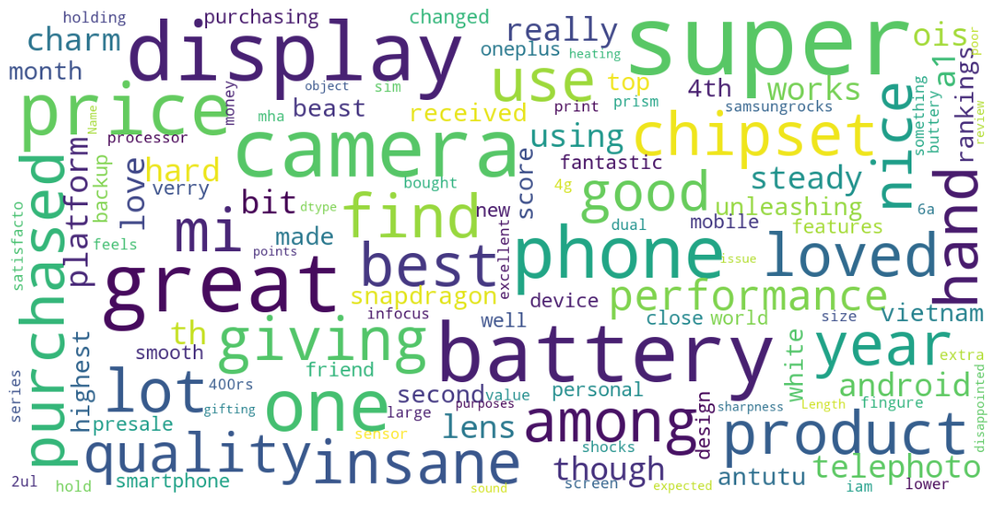

In [102]:

# wordcloud function

from wordcloud import WordCloud
import matplotlib.pyplot as plt

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color = 'white',
        max_words = 200,
        max_font_size = 40, 
        scale = 3,
        random_state = 42
    ).generate(str(data)) 

    fig = plt.figure(1, figsize = (20, 20))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize = 20)
        fig.subplots_adjust(top = 2.3)

    plt.imshow(wordcloud)
    plt.show()
    
# print wordcloud
show_wordcloud(data["review"])

### we can see some more frequent word are camera , battery,phone and display more relevant to mobile phones also some positive words like super,good,nice .

###  no. of reviews per Month

In [103]:
data1 = data
data1['date'].groupby([data1.date.dt.year, data1.date.dt.month]).agg('count')

date  date
2019  6        3852
      7        6035
      8        9784
      9        7342
      10      16079
      11      14555
      12      12477
2020  1       12597
      2       15276
      3       11920
      4        1331
      5       29471
Name: date, dtype: int64

### Note- Months are in sequence in number like - 1(January),2(February),3 (March) etc

## Removing Stopwords

In [0]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')  

In [0]:
# function to remove stopwords
def remove_stopwords(rev):
    rev_new = " ".join([i for i in rev if i not in stop_words])
    return rev_new 

In [106]:
remove_stopwords(data['review']) 

'i really love the camera though i would have loved a telephoto lens the super steady ois works like a charm i have been using mi a1 with android one platform before i find it a bit hard to find the settings options in s10 lite and mostly resort to google search figure out the settings the phone is fast great display the included case won t keep the dust out and will require regular cleaning or will damage the phone s outer layer the fingerprint scanner is small and not so accurate  unleashing the beast among snapdragon 855 highest antutu score of 472721 for 855 chipset 4th among the top rankings second to 855 chipset i received an all white product made in vietnam month year of manufacture import january 2020 the box content includes prism white samsung s10 lite mobile phone white charging adapter white c type cable white c type earphones along with 2 extra pairs of ear plugs clear type tpu case good quality pre applied screen  i purchased this product during its presale i was purchas

### Removing short words with length < 3

In [0]:
# remove short words (length < 3)
data['review'] = data['review'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>2]))

# remove stopwords from the text
reviews = [remove_stopwords(r.split()) for r in data['review']]

# make entire text lowercase  
reviews = [r.lower() for r in reviews] 

In [50]:
reviews

['really love camera though would loved telephoto lens super steady ois works like charm using android one platform find bit hard find settings options s10 lite mostly resort google search figure settings phone fast great display included case keep dust require regular cleaning damage phone outer layer fingerprint scanner small accurate',
 'unleashing beast among snapdragon 855 highest antutu score 472721 855 chipset 4th among top rankings second 855 chipset received white product made vietnam month year manufacture import january 2020 box content includes prism white samsung s10 lite mobile phone white charging adapter white type cable white type earphones along extra pairs ear plugs clear type tpu case good quality pre applied screen',
 'purchased product presale purchasing new device personal use years smartphone world changed lot since close friend purchased oneplus launched purchasing comparable phone tough competition personally read details weeks experience using handset nearly 

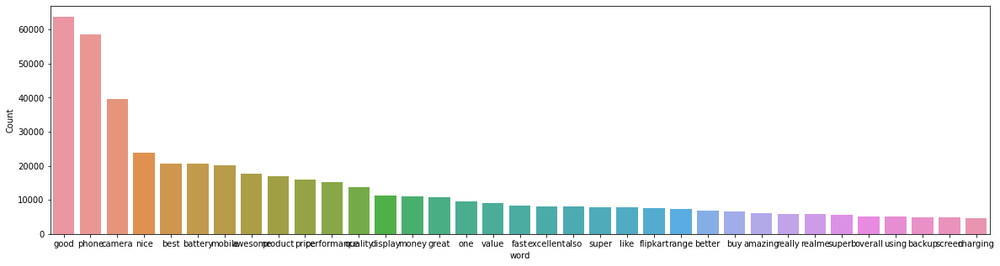

In [51]:
freq_words(reviews, 35)

### We can see in this plot we got more relevant most frequent words are "good","phone" ,"camera" etc insteed of nonrelevant words like in first frequency graph we got. 
### Now we will do lemmatization by using spaCy library.  It reduces any given word to its root form thereby reducing multiple forms of a word to a single word.

In [0]:
nlp = spacy.load('en', disable=['parser', 'ner'])

In [0]:
def lemmatization(texts, tags=['NOUN', 'ADJ']):
    output = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        output.append([token.lemma_ for token in doc if token.pos_ in tags])
    return output 

In [110]:
## Tokenizing the reviews and then lemmatize the tokenize reviews
tokenized_reviews = pd.Series(reviews).apply(lambda x: x.split()) 
print(tokenized_reviews[1]) 

['unleashing', 'beast', 'among', 'snapdragon', '855', 'highest', 'antutu', 'score', '472721', '855', 'chipset', '4th', 'among', 'top', 'rankings', 'second', '855', 'chipset', 'received', 'white', 'product', 'made', 'vietnam', 'month', 'year', 'manufacture', 'import', 'january', '2020', 'box', 'content', 'includes', 'prism', 'white', 'samsung', 's10', 'lite', 'mobile', 'phone', 'white', 'charging', 'adapter', 'white', 'type', 'cable', 'white', 'type', 'earphones', 'along', 'extra', 'pairs', 'ear', 'plugs', 'clear', 'type', 'tpu', 'case', 'good', 'quality', 'pre', 'applied', 'screen']


In [111]:
print(tokenized_reviews[1])
len(tokenized_reviews[1]) 

['unleashing', 'beast', 'among', 'snapdragon', '855', 'highest', 'antutu', 'score', '472721', '855', 'chipset', '4th', 'among', 'top', 'rankings', 'second', '855', 'chipset', 'received', 'white', 'product', 'made', 'vietnam', 'month', 'year', 'manufacture', 'import', 'january', '2020', 'box', 'content', 'includes', 'prism', 'white', 'samsung', 's10', 'lite', 'mobile', 'phone', 'white', 'charging', 'adapter', 'white', 'type', 'cable', 'white', 'type', 'earphones', 'along', 'extra', 'pairs', 'ear', 'plugs', 'clear', 'type', 'tpu', 'case', 'good', 'quality', 'pre', 'applied', 'screen']


62

In [112]:
reviews_2 = lemmatization(tokenized_reviews)
print(reviews_2[1])
len(reviews_2[1])    

['unleashing', 'beast', 'high', 'score', 'chipset', '4th', 'top', 'ranking', 'chipset', 'white', 'product', 'month', 'box', 'content', 'cable', 'white', 'type', 'earphone', 'extra', 'pair', 'ear', 'clear', 'type', 'tpu', 'case', 'good', 'quality', 'screen']


28

In [113]:
set(tokenized_reviews[1]) - set(reviews_2[1])  

{'2020',
 '472721',
 '855',
 'adapter',
 'along',
 'among',
 'antutu',
 'applied',
 'charging',
 'earphones',
 'highest',
 'import',
 'includes',
 'january',
 'lite',
 'made',
 'manufacture',
 'mobile',
 'pairs',
 'phone',
 'plugs',
 'pre',
 'prism',
 'rankings',
 'received',
 's10',
 'samsung',
 'second',
 'snapdragon',
 'vietnam',
 'year'}

In [0]:
sentences = data['review'] 

In [115]:
sentences 

0         really love the camera though would have loved telephoto lens the super steady ois works like charm have been using with android one platform before find bit hard find the settings options s10 lit...
1         unleashing the beast among snapdragon 855 highest antutu score 472721 for 855 chipset 4th among the top rankings second 855 chipset received all white product made vietnam month year manufacture i...
2         purchased this product during its presale was purchasing new device for personal use after years the smartphone world had changed lot since then but close friend purchased oneplus when was launche...
3                                                                                             one the best phone ever this price verry smooth use well battery backup and fantastic display and design just loved
4                                       insane great mobile with great features and great processor with super display and insane camera when hold hand feels li

### •	most common words in review text

In [116]:
freq = pd.Series(' '.join(data['review']).split()).value_counts()[:10]
freq 

good      63738
phone     58448
the       48811
and       46567
this      40119
camera    39578
for       35179
very      29447
nice      23766
not       21778
dtype: int64

### •	most rare words in review text 

In [117]:
rare = pd.Series(' '.join(data['review']).split()).value_counts()[-10:]
rare

duplexer        1
beautifulbut    1
oral            1
appealing3      1
nicerealme      1
ayya            1
type5           1
fantsatic       1
highaly         1
vandarfull      1
dtype: int64

In [118]:
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


True

In [119]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [120]:
# add sentiment anaylsis columns
from nltk.sentiment.vader import SentimentIntensityAnalyzer

sid = SentimentIntensityAnalyzer() 
data["sentiments"] = data["review"].apply(lambda x: sid.polarity_scores(x))
data = pd.concat([data.drop(['sentiments'], axis=1), data['sentiments'].apply(pd.Series)], axis=1) 



/usr/local/lib/python3.6/dist-packages/nltk/twitter/__init__.py:20: UserWarning: The twython library has not been installed. Some functionality from the twitter package will not be available.
  warnings.warn("The twython library has not been installed. "


# Most Positive and Negative review based on sentiment analysis

In [121]:
data.head()

,date,review,word_count,char_count,avg_word,stopwords,hastags,numerics,upper,neg,neu,pos,compound
0,2020-02-24,really love the camera though would have loved telephoto lens the super steady ois works like charm have been using with android one platform before find bit hard find the settings options s10 lit...,86,492,4.732558,28,0,0,6,0.048,0.685,0.267,0.9709
1,2020-02-24,unleashing the beast among snapdragon 855 highest antutu score 472721 for 855 chipset 4th among the top rankings second 855 chipset received all white product made vietnam month year manufacture i...,74,485,5.567568,10,0,4,3,0.000,0.899,0.101,0.7430
2,2020-02-24,purchased this product during its presale was purchasing new device for personal use after years the smartphone world had changed lot since then but close friend purchased oneplus when was launche...,87,500,4.758621,31,0,1,5,0.025,0.888,0.087,0.6486
3,2020-02-24,one the best phone ever this price verry smooth use well battery backup and fantastic display and design just loved,24,132,4.541667,8,0,0,0,0.000,0.537,0.463,0.9300
4,2020-02-24,insane great mobile with great features and great processor with super display and insane camera when hold hand feels like iam holding prism hand samsungrocks one shocks,42,214,4.805556,9,1,0,2,0.160,0.339,0.501,0.9590


In [0]:
def emotion(score):
    if score > 0:
        return "positive"
    if score < 0:
        return "negative"
    if score == 0:
        return "neutral"


In [126]:
data['sentiments'] = data['compound'].apply(lambda x:emotion(x))
data.sample(5)

,date,review,word_count,char_count,avg_word,stopwords,hastags,numerics,upper,neg,neu,pos,compound,sentiments
2053,2020-02-24,super,1,5,5.000000,0,0,0,0,0.000,0.000,1.000,0.5994,positive
29387,2019-09-26,nice phone good performancedisplay quality are good but not better,10,66,5.700000,3,0,0,0,0.209,0.402,0.389,0.1756,positive
90,2020-02-24,back camera which material specific has been used for protection back camera lenses the whole module protrudes out bit please answer review display display may feel immersive but didn feel like wa...,69,490,6.205882,21,0,0,3,0.000,0.757,0.243,0.9485,positive
57736,2019-10-26,best,1,4,4.000000,0,0,0,0,0.000,0.000,1.000,0.6369,positive
39228,2019-12-26,nice phone,2,10,4.500000,0,0,0,0,0.000,0.263,0.737,0.4215,positive


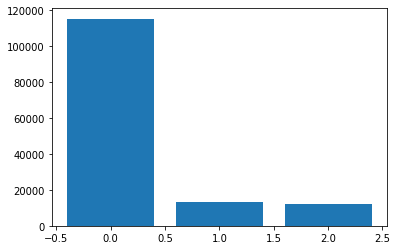

positive    115419
neutral      13076
negative     12224
Name: sentiments, dtype: int64


In [130]:
counts = data["sentiments"].value_counts()
plt.bar(range(len(counts)), counts)
plt.show()
print(counts)

In [0]:
date1 = data1['date'].groupby([data1.date.dt.year, data1.date.dt.month]).agg('count')

In [0]:
from collections import Counter

In [139]:
# highest positive sentiment reviews (with more than 5 words)
data[data["word_count"] >= 5].sort_values("pos", ascending = False)[["review", "pos"]].head(10)


,review,pos
20884,super,1.0
62993,amazing,1.0
2102,awesome like honor,1.0
27314,awesome,1.0
149,awesome,1.0
20636,nice,1.0
20642,awesome,1.0
16851,excellent,1.0
105885,best prize,1.0
22774,excellent nice good,1.0


In [140]:
#all # highest positive sentiment reviews (with more than 5 words)
data[data["word_count"] >= 5].sort_values("pos", ascending = False)[["review", "pos"]]

,review,pos
20884,super,1.0
62993,amazing,1.0
2102,awesome like honor,1.0
27314,awesome,1.0
149,awesome,1.0
...,...,...
129917,battery back about 12hrs only,0.0
82490,mobile working very fast and responsivevalue for moneygot for16k exchange,0.0
129929,phone not working after months,0.0
129935,have bought this phone and after days camera not working,0.0


In [141]:
# lowest negative sentiment reviews (with more than 5 words)
data[data["word_count"] >= 5].sort_values("neg", ascending = False)[["review", "neg"]].head(10)


,review,neg
49161,very bad hate,0.886
117445,camera worse horrible,0.868
140283,not good promise,0.814
24606,killer phone,0.811
70632,bad battery backup worst batteryreplacement worst,0.796
75250,waste money performance dad that phone worst worst worst worst,0.793
115561,not feeling good,0.791
12248,very bad,0.791
116393,airphone cheating only cheating,0.783
23885,sad very bad mobile,0.775


## Comparison of the analysis of reviews with noise and without noise

### with noise the score of positive ,negative and nuetral and compoud (final after joining all 3 the result) are
Overall Sentiment Score for the multiple sentences :-  
+ neg         0.038598
+ neu         0.500213
+ pos         0.461189
+ compound    0.7294


### without noise the score of positive ,negative and nuetral and compoud (final after joining all 3 the result) are
Overall Sentiment Score for the multiple sentences :-  
+ neg         0.0418
+ neu         0.4607
+ pos         0.4912
+ compound    0.7322



# TOPIC MODELING

## Building LDA Model
We will start by creating the term dictionary of our corpus, where every unique term is assigned an index

In [0]:
# Create the term dictionary of our corpus, where every unique term is assigned an index
dictionary = corpora.Dictionary(reviews_2) 

### Now we will convert the list of reviews (reviews_2) into a Document Term Matrix using the dictionary prepared above.

In [0]:
# Convert list of reviews (reviews_2) into a Document Term Matrix using the dictionary prepared above.
doc_term_matrix = [dictionary.doc2bow(rev) for rev in reviews_2]

In [0]:
# Creating the object for LDA model using gensim library
LDA = gensim.models.ldamodel.LdaModel 

In [145]:
# Build LDA model
lda_model = LDA(corpus=doc_term_matrix,
                id2word=dictionary,
                num_topics=7, 
                random_state=100,
                chunksize=1000,
                passes=50) 

Streaming output truncated to the last 5000 lines.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Us

Buffered data was truncated after reaching the output size limit.

### I have specified the number of topics as 7 for this model using the num_topics parameter.
##Let’s print out the topics that our LDA model has learned.

In [0]:
# Print the Keyword in the 7 topics
lda_model.print_topics()

[(0,
  '0.149*"product" + 0.120*"good" + 0.086*"excellent" + 0.058*"delivery" + 0.054*"flipkart" + 0.041*"thank" + 0.040*"awesome" + 0.037*"portrait" + 0.033*"happy" + 0.025*"fast"'),
 (1,
  '0.145*"mobile" + 0.080*"phone" + 0.063*"amazing" + 0.041*"budget" + 0.027*"photo" + 0.021*"dslr" + 0.019*"buy" + 0.017*"perfect" + 0.015*"feature" + 0.013*"smart"'),
 (2,
  '0.084*"camera" + 0.054*"battery" + 0.031*"day" + 0.028*"light" + 0.019*"quality" + 0.019*"mode" + 0.017*"great" + 0.017*"display" + 0.017*"performance" + 0.017*"low"'),
 (3,
  '0.347*"good" + 0.141*"phone" + 0.079*"camera" + 0.074*"price" + 0.042*"quality" + 0.035*"performance" + 0.033*"range" + 0.020*"battery" + 0.018*"awesome" + 0.016*"overall"'),
 (4,
  '0.064*"phone" + 0.040*"bad" + 0.036*"android" + 0.033*"problem" + 0.030*"experience" + 0.029*"issue" + 0.025*"time" + 0.025*"update" + 0.022*"average" + 0.018*"screen"'),
 (5,
  '0.242*"nice" + 0.216*"phone" + 0.052*"product" + 0.029*"redmi" + 0.028*"super" + 0.028*"note" +

### We can see that Topic 4 is more related to phone as it has terms like - phone,bad,android etc and Topic 6 is also more related as it has terms like - money, great,value,phone etc

# Topic Visualization
### Now we will visualize Topics by plot by using pyLDAvis

In [0]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, doc_term_matrix, dictionary)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.291133 -0.204180       1        1  28.044319
3     -0.137330  0.081644       2        1  20.815355
4      0.011848 -0.204962       3        1  14.064296
1      0.214602 -0.092631       4        1  10.416916
0     -0.153603  0.330655       5        1   9.306531
6      0.127625 -0.044499       6        1   8.809988
5      0.227992  0.133973       7        1   8.542600, topic_info=         Term          Freq         Total Category  logprob  loglift
36       good  69852.000000  69852.000000  Default  30.0000  30.0000
303      nice  17354.000000  17354.000000  Default  29.0000  29.0000
16      phone  59792.000000  59792.000000  Default  28.0000  28.0000
82     mobile  12673.000000  12673.000000  Default  27.0000  27.0000
40    product  15399.000000  15399.000000  Default  26.0000  26.0000
...       ...           ...           ...      ...      ...      ...
1108      min    225.575760    226.221085   Topic7  -5.7606   2.4572
16      phone  15437.260742  59792.589844   Topic7  -1.5347   1.1060
40    product   3747.413086  15399.778320   Topic7  -2.9504   1.0468
1342   effect    401.878479   1319.442139   Topic7  -5.1831   1.2713
824      cost    256.804840    503.542786   Topic7  -5.6309   1.7868

[317 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
1716      4  0.998809        15k
1333      2  0.996810        1st
2150      2  0.996305        20k
1004      2  0.994654        2nd
671       6  0.998831       able
...     ...       ...        ...
201       6  0.999782      worth
1003      2  0.996686     worthy
71        3  0.999893       year
480       5  0.996748  yesterday
72        6  0.997531    youtube

[322 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 4, 5, 2, 1, 7, 6])

# Expalaination
### Here I have plotted topic wise term frequency. In the left of the graph there are topics in circles . The size of the circles shows that how much the topic is relevant to for the modeling larger the size more the topic is relevant . 
### The distance between the topics shows that how the topics are related to each other .
### In the right of the graph we can see the the bar graph with blue and red colour . Red color shows the frequency of the perticular word in the selected topic and blue colour showa the frequency of the word in all the topics.
### By using lembda (on the right corner) we can adjust the relevant frequencies of the word how we want to see . 
 if we take value of lembda = 0 it will only show the frequency of the word in that topic only it will not show that blue bar .

In [0]:
# Build LDA model
lda_model = LDA(corpus=doc_term_matrix,
                id2word=dictionary,
                num_topics=5, 
                random_state=100,
                chunksize=1000,
                passes=50) 

Streaming output truncated to the last 5000 lines.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Us

In [0]:
#Print the Keyword in the 5 topics
lda_model.print_topics()

[(0,
  '0.176*"product" + 0.090*"good" + 0.080*"excellent" + 0.054*"delivery" + 0.050*"flipkart" + 0.039*"awesome" + 0.038*"thank" + 0.035*"love" + 0.030*"happy" + 0.023*"service"'),
 (1,
  '0.101*"camera" + 0.068*"good" + 0.037*"mobile" + 0.037*"quality" + 0.032*"battery" + 0.030*"great" + 0.026*"performance" + 0.023*"light" + 0.019*"low" + 0.017*"display"'),
 (2,
  '0.298*"phone" + 0.202*"nice" + 0.071*"amazing" + 0.046*"budget" + 0.024*"dslr" + 0.023*"super" + 0.019*"satisfied" + 0.014*"fantastic" + 0.011*"weight" + 0.010*"card"'),
 (3,
  '0.298*"good" + 0.151*"phone" + 0.095*"price" + 0.053*"money" + 0.043*"range" + 0.040*"value" + 0.029*"camera" + 0.022*"worth" + 0.020*"performance" + 0.013*"overall"'),
 (4,
  '0.061*"phone" + 0.038*"day" + 0.031*"battery" + 0.025*"issue" + 0.021*"bad" + 0.020*"time" + 0.019*"device" + 0.017*"problem" + 0.016*"experience" + 0.016*"android"')]

In [0]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, doc_term_matrix, dictionary)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.212265 -0.176643       1        1  34.322563
4      0.165756 -0.290850       2        1  26.798695
3     -0.045271  0.115562       3        1  18.200714
0     -0.235929  0.176327       4        1  10.927608
2      0.327708  0.175605       5        1   9.750419, topic_info=        Term          Freq         Total Category  logprob  loglift
16     phone  61215.000000  61215.000000  Default  30.0000  30.0000
36      good  73279.000000  73279.000000  Default  29.0000  29.0000
303     nice  16534.000000  16534.000000  Default  28.0000  28.0000
40   product  16143.000000  16143.000000  Default  27.0000  27.0000
77     price  14521.000000  14521.000000  Default  26.0000  26.0000
..       ...           ...           ...      ...      ...      ...
713   couple    217.863312    218.499725   Topic5  -5.9277   2.3249
922    usual    215.196518    215.827759   Topic5  -5.9400   2.3249
70     world    209.750916    210.372757   Topic5  -5.9657   2.3249
16     phone  24334.996094  61215.957031   Topic5  -1.2119   1.4054
348   memory    516.525208    644.617310   Topic5  -5.0645   2.1063

[223 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
1333      3  0.997432         1st
1004      3  0.996053         2nd
759       3  0.996967  affordable
254       5  0.999976     amazing
355       3  0.996151      amount
...     ...       ...         ...
354       2  0.999625        work
70        5  0.998228       world
201       3  0.999702       worth
1003      3  0.998929      worthy
71        2  0.999910        year

[213 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 5, 4, 1, 3])

In [0]:
# Build LDA model
lda_model = LDA(corpus=doc_term_matrix,
                id2word=dictionary,
                num_topics=6, 
                random_state=100,
                chunksize=1000,
                passes=50) 

Streaming output truncated to the last 5000 lines.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Us